## Fourier series
Using what we've learnt so far, we're finally ready to get into some analysis (and synthesis) of simple audio signals. We'll start by looking into the Fourier series and get some more intuition behind the underlying math and how it connects to phasors and the complex sinusoid. 

In [ ]:
# Importing the packages as usual
%pip install ipympl
import numpy as np 
import matplotlib
if not hasattr(matplotlib.RcParams, "_get"):
    matplotlib.RcParams._get = dict.get
from matplotlib import pyplot as plt
from  matplotlib import patches, collections
from matplotlib.lines import Line2D
from matplotlib.ticker import FormatStrFormatter
from ipywidgets import * # interactive plots
import IPython
from matplotlib import animation
import IPython
from IPython.display import Audio, HTML
%matplotlib ipympl

# This is a CSS style for the animation controls in this notebook.
controls_css = """
<style>
.anim-controls button {
    font-size: 4px !important;
    padding: 2px 10px !important;
}
.anim-controls {
    margin-top: 4px;
}
</style>
"""

### What is the Fourier Series?

Think about any periodic signal, i.e., any signal that repeats at some regular interval, perhaps a square wave or a triangle wave. Let's denote this periodic signal as $f(t)$ (where $t$ is time) and let's refer to this regular interval as the fundamental period, $T_{0}$ (seconds). This tells us that the fundamental frequency, $f_{o}$, of $f(t)$, is then $f_{0} = 1/T_{0}$ (Hz) and hence it's fundamental angular frequency is given by $\omega_{0} = 2\pi f_{0} = 2\pi/T_{0}$.

The Fourier series tells us that we can approximate any periodic signal, $f(t)$ as an infinite sum of sinusoids whose frequencies are integer multiples of the fundamental frequency and where each sinusoid has a particular amplitude and phase. Mathematically we can express this as

$$\begin{align}
f(t) &= \frac{1}{2} a_0 + \sum_{n=1}^{\infty}A_n\cos(n\omega_0 t + \theta_n) \nonumber \\
&= \frac{1}{2} a_0 + A_1\cos(\omega_0 t + \theta_1) + A_2\cos(2\omega_0 t + \theta_2) +  A_2\cos(3\omega_0 t + \theta_3) + \dots  \nonumber
\end{align}$$ 

where the term $\frac{1}{2} a_0$ is referred to as the DC offset (it simply allows for scaling of the signal along the y-axis). The more interesting term is in the summation for which you should recognize from the [the sinusoidal model notebook](https://randyaliased.github.io/acspjbook/main/fundamental/01_Sinusoidal_Model.html)! The only difference is the index $n$ over which we sum. Because $n$ takes integer values, we can see that when we exapnd the summation, the frequencies of the sinusoids are integer multiples of the fundamental frequency. It's worth pausing to appreciate this remarkable result for a minute - the simple sinusoidal model we looked at in the first notebook is essentially the building block for more complex sounds.  


### Trigonometric form of the Fourier Series

The form of the Fourier series above is conceptually useful but less so when we actually want to use it in practice. We'll see two other forms in this notebook. The first of those is what we refer to as the **trigonometric form** of the Fourier Series. We can derive that by recalling $\cos(A+B) = \cos A \cos B – \sin A \sin B$:

$$\begin{align}
  f(t) &= \frac{1}{2} a_0 + \sum_{n=1}^{\infty}A_n\cos(n\omega_0 t + \theta_n) \\
		 & = \frac{1}{2} a_0 + \sum_{n=1}^{\infty} \left(A_n\cos(n\omega_0 t)\cos(\theta_n)-A_n\sin(n\omega_0 t)\sin(\theta_n)\right)\\
		& = \frac{1}{2} a_0 + \sum_{n=1}^{\infty}A_n\cos(\theta_n)\cos(n\omega_0 t)+\sum_{n=1}^{\infty}-A_n\sin(\theta_n)\sin(n\omega_0 t)
\end{align}$$


By letting $a_n = A_n\cos(\theta_n)$ and $b_n = -A_n\sin(\theta_n)$, we express the trigonometric form of the Fourier Series for any periodic signal, $f(t)$ as

$$\begin{align}
  f(t) &= \frac{1}{2} a_0 + \sum_{n=1}^{\infty}a_n \cos (n\omega_0 t)+\sum_{n=1}^{\infty}b_n \sin (n\omega_0 t)
\end{align}$$

Therefore, given the coefficients $a_n$ (for $n=0,1,2, \dots$) and $b_n$ (for $n=1,2,\dots$), we can reconstruct an approximation to the periodic signal, $f(t)$. This is what we call the **synthesis** equation. We can effectively synthesize any periodic signal such as a square wave or triangle wave once we know the coefficients $a_n$ and $b_n$. We also have the liberty of deciding how many terms we want to use in the summation to do the synthesis. Practically we cannot go up to infinity and computational resources will put a constraint as to how many terms we can realistically use.

But so the question now is - how do we find $a_n$ and $b_n$? For this, we need to do the contrary to synthesis. Given the signal $f(t)$, we have to use the **analysis** equation in order to compute $a_n$ and $b_n$. I'm not going to go through the derivation to come up with the formula, but you can rest assured that the coefficients, $a_n$ and $b_n$ can be found by evaluating the following integrals

$$\begin{align}
	a_n &=  \frac{2}{T_0}\int_{t_0}^{t_0+T_0}f(t) \cos (n\omega_0 t)~\text{d}t\quad \text{for}~~n=0,1,2,...\\
	 b_n &=  \frac{2}{T_0}\int_{t_0}^{t_0+T_0} f(t) \sin (n\omega_0 t)~\text{d}t\quad \text{for}~~n=1,2,...\\
\end{align}$$

Doing these integrals require good old pen and paper and are much more insightful and satisfying when you do them for the first time (as opposed to an effortless extraction from Chat GPT). Let's look at an example and get to the Python interaction to piece all of this together.


### A square wave example

Fig. 1 shows a square wave, denoted as $f(t)$ with a fundamental period, $T_{0}$.

<div>
<center> <img src="square_wave.png" width="600"/> <center/>
    <p style="text-align:center">Fig. 1 - A square wave with period T<sub>0</sub>. </p>
</div>

<br>

We can express $f(t)$ mathematically as

$$\begin{align}
	f(t) = \begin{cases} 1 &\text{for} \hspace{0.5cm}  0 < t \leq T_0/2 \\ 
                          -1 & \text{for} \hspace{0.5cm}  T_0/2 < t \leq T_0 \\  \end{cases}
\end{align}$$



The next step is to do the analysis - i.e., obtain $a_n$ and $b_n$ by computing the integrals above. (I'll leave this for you as an exercise). You should find that the coefficients are subsequently given by

$$\begin{align}
	a_n &=  0 \\
     b_n &= \frac{2}{n \pi} \left[ 1 - (-1)^{n} \right] = \begin{cases}4/(n\pi)&\text{for}~n~\text{odd}\\0&\text{for}~n~\text{even}\end{cases}
\end{align}$$


Hence, the Fourier Series approximation of the square wave $f(t)$ is:
$$\begin{align}
  	f(t) = \sum_{n=1}^{\infty}b_n \sin (n\omega_0 t)
\end{align}$$

with $b_n$ defined as above. Note how the square wave consists of only odd-integered sinusoidal components. We can now use this expression to synthesize our own square wave!

Let's do an interactive plot to see how this all works out. In the following $N$ is the number of terms used in the Fourier series. Increase this to add more terms. In the top plot, you will see all of the individual sinusoidas overlaid on one another, and in the bottom plot, you will see the resulting waveform from summing up all the sinusoids. You can also listen to the result and change the fundamental frequency.



Move the slider to see how the parameters change the cosine and listen to the result. The sound you hear is the sum of the sinusoids.


interactive(children=(IntSlider(value=1, description='N', max=30, min=1), IntSlider(value=300, description='f'…

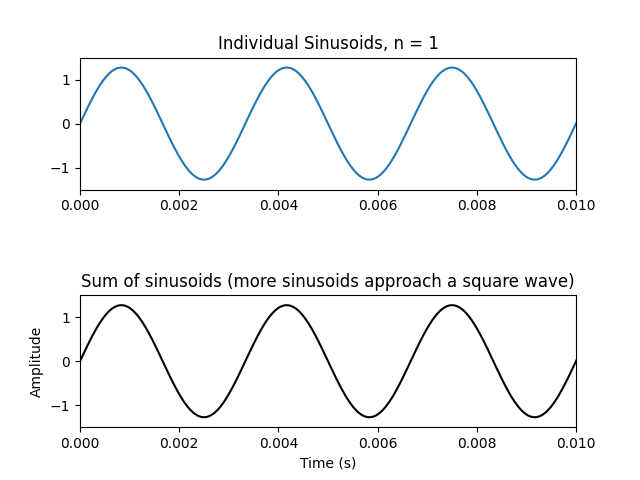

In [4]:
# Setting up the plots
fig, axes = plt.subplots(2,1)
fig.subplots_adjust(hspace=0.8)  # horizontal spacing

dt = 0.00001 # time spacing
t = np.arange(0,2,dt) # range of times to plot on x-axis
axes[0].set_ylabel('Amplitude', color='k')
axes[0].set_xlabel('Time (s)', color='k')
axes[0].xaxis.set_major_formatter(FormatStrFormatter('%.3f'))
axes[0].set_xlim([0, 0.01])

sum_waves, = axes[1].plot([], [], 'k')
axes[1].set_ylabel('Amplitude', color='k')
axes[1].set_xlabel('Time (s)', color='k')
axes[1].xaxis.set_major_formatter(FormatStrFormatter('%.3f'))
axes[1].set_title('Sum of sinusoids (more sinusoids approach a square wave)')
axes[1].set_xlim([0, 0.01])
axes[1].set_ylim([-1.5, 1.5])



# Create the interactive plot
def update(N = 1, f=300):
    
    axes[0].clear()
    axes[0].set_xlim([0, 0.01])
    axes[0].set_ylim([-1.5, 1.5])
    Y = np.zeros([len(t),N])

    for n in range(N):
        fo = (n+1)*f
        # These are the Fourier Series coefficients for a square wave
        # But you can change them to any other values you like to see what happens 
        # (There are specific values for the coefficients for different waveforms)
        an = 0
        bn = (2/((n+1)*np.pi))*(1-(-1)**(n+1)) 
        #
        Y[:,n] = an*np.cos(2*np.pi*fo*t) + bn*np.sin(2*np.pi*fo*t)
        axes[0].plot(t, Y[:,n])
        axes[0].set_title('Individual Sinusoids, n = '+str(n+1))

    Y_sum = np.sum(Y,axis=1)
    sum_waves.set_data(t, Y_sum)
    fig.canvas.draw_idle()

    IPython.display.display(Audio(Y_sum.T, rate=1/dt,normalize=True))


print('Move the slider to see how the parameters change the cosine and listen to the result. The sound you hear is the sum of the sinusoids.')
interact(update, N = (1,30,1), f=(100,1000,1));

### Complex Exponential Form of the Fourier Series

The Fourier series of a periodic signal, $f(t)$ can be expressed in an even more compact form using the complex exponentials (recall that we encountered in the [previous notebook](https://randyaliased.github.io/acspjbook/main/fundamental/03_Phasors.html)) as follows  

$$\begin{equation}
	f(t) = \sum\limits_{n=-\infty}^{\infty}c_n e^{jn\omega_0 t} 
\end{equation}$$

Note that now we are summing from $-\infty$ to $+\infty$. The coefficient $c_n$ is a [phasor](https://randyaliased.github.io/acspjbook/main/fundamental/03_Phasors.html#what-is-a-phasor), i.e., a complex in [exponential form](https://randyaliased.github.io/acspjbook/main/fundamental/02_Complex_numbers.html#general-exponential-form) with some amplitude and phase. The coefficient, $c_n$ is related to the trigonometric form coefficients, $a_n$ and $b_n$ such that (try to prove this for yourself)

$$\begin{align}
a_n &= c_n + c_{-n} \\
b_n &= j(c_n - c_{-n})
\end{align}$$

Once again, once we have the coefficient, $c_n$, we can use the complex exponential form of the Fourier series to synthesize our periodic signal. This time however, the result will be complex-valued, but as we saw when we looked at phasors, simply taking the real part will give us the waveform of interest. Compared to the trigonometric form, the advantage is that we only have one set of coefficients to compute. So how do we compute them?

Yet another integral, but only one! Here is the analysis equation for computing $c_n$ given $f(t)$:

$$\begin{equation} 
	c_n =\frac{1}{T_0}\int_{t_0}^{t_0+T_0}f(t)e^{-jn\omega_0 t}\text{d}t
\end{equation}$$

We can interpret this integral as computing a correlation between the signal $f(t)$ and specific complex exponentials defined at integer multiples of $\omega_o$, i.e., at $n \omega_o$ for $n = 0, \pm 1, \pm 2, \dots, \pm infty$. Hopefully it's starting to become evident why we like complex exponentials so much: integrating (and differentiating) exponentials is really simple, and for complex exponentials, we treat the imaginary number, $j$ as a constant. Let's work out the square wave example again but using the complex exponential form.


### A square wave example using the complex exponential form

Let's consider again the previous square wave signal, $f(t)$. Recalling its mathematical expression:

$$\begin{align}
	f(t) = \begin{cases} 1 &\text{for} \hspace{0.5cm}  0 < t \leq T_0/2 \\ 
                          -1 & \text{for} \hspace{0.5cm}  T_0/2 < t \leq T_0 \\  \end{cases}
\end{align}$$

Now let's apply the analysis equation for the complex exponential form of the Fourier series to compute $c_n$ (I've left out the missing steps for you to try the integral, *a hint: you will encounter expressions such as $e^{-jn \pi}$. How can this be simplified?* ):

$$\begin{align}
    c_n&=\frac{1}{T_0}\left\{\int_{0}^{T_0/2}(1)e^{-jn\omega_0 t}\text{d}t+
    \int_{T_0/2}^{T_0}(-1)e^{-jn\omega_0 t}\text{d}t\right\}\\
    &=\frac{1}{j n\pi}\left(1-(-1)^n\right)=
    	\begin{cases}\frac{2}{j n\pi} & n~~\text{odd}\\ 0 &  n~~\text{even}\end{cases}
\end{align}$$

As with the trigonometric form, we also observe that only odd-integered sinusoidal components are relevant for the square wave.  We can also write $c_n$ as a phasor:

$$\begin{equation}
    c_{n} = \left| \frac{2}{n\pi} \right| e^{-j \frac{\pi}{2} \hspace{0.05cm} \text{sgn}(n) } \hspace{0.5cm} n~~\text{odd}
\end{equation}$$

 where $|.|$ takes the absolute value and sgn(.) is the sign function, which takes the sign of its argument (recall $n$ can be positive or negative). Hence in this phasor representation of $c_{n}$, we can recognize the modulus as $\left| \frac{2}{n\pi} \right|$ and the argument as $- \frac{\pi}{2} \hspace{0.05cm} \text{sgn}(n)$ for odd values of $n$.
 

The complex exponential Fourier series is then finally given by

$$\begin{equation}
    f(t) = \sum\limits_{\substack{n=-\infty \\n~odd }}^{\infty} \left| \frac{2}{n\pi} \right| e^{-j \frac{\pi}{2} \hspace{0.05cm} \text{sgn}(n) } \hspace{0.02cm} e^{jn\omega_0 t}
\end{equation}$$


Let's consider the terms from this series from $n=-3$ and $n=+3$ (since it's odd terms only, that means, n=-3,-1,+1,+3) and let's run a similar animtation as we did in phasors when [adding sine waves of different frequencies](https://randyaliased.github.io/acspjbook/main/fundamental/03_Phasors.html#adding-sinusoids-with-different-frequencies). What we observe is that we can geometrically interpret of each of these complex exponential Fourier series terms as these rotating vectors. The sum of all of these is what plots out our square wave approximation through the Fourier series. Note as well the pairs of complex sinusoids for the same numerical value of n, but with different sign (e.g., n=-1,+1). Each of these result in two rotating vectors but in opposite directions, and also because they have opposite signs on their phase, each of them will correspond to a sine wave at that particular frequency. These are also plotted on the right-hand plot below (there are actually two overlaid on top one another, each at an amplitude of 0.5, which is how the sum gets the correct amplitude of approximately 1). I would encourage you to (a) take some pen and paper and reason this out for yourself from the math, and (b) play around with the animation by adding more terms in the summation and/or inserting different values for the phasors and see what interesting waveforms you generate.



In [ ]:
# The square wave example
# Generate a list of the phasor parameters corresponding to the number of terms 

n_range_pos = np.arange(1,5,2, dtype=float) # positive n values (the next line interleaves this sequence for positive and negative n values) !! change if you want more terms !!
n_range = np.repeat(n_range_pos, 2) * np.tile([1, -1], len(n_range_pos)) # interleave to get sequence of positive and negative n values

f0 = 1 # fundamental frequency (keep this to 1 for simplicity)
phasor_list = [] 

for n in n_range:
    cn = 2/(1j*n*np.pi)     # complex Fourier series coefficient cn !! You can change this !!
    A = np.abs(cn) # get its absolute value
    theta = np.angle(cn)    # get its phase
    phasor_list.append((A, f0, theta, n)) # This is the form of the phasor parameters our animation needs

##----------##

# These are all functions to get everything to work (you can comfortably ignore or look through if you want to change/understand details)
#  Functions for making sinusoids and setting up the axes
def _make_compsin(A, f0, theta, n, t):
    "Making a complex sinusoid"
    # A - amplitude, f0 - fundamental frequency, theta - phase, n - the harmonic number (can be +ve or -ve), t - time array
    w0 = 2*np.pi*n*f0 
    z_phasor = A * np.exp(1j*theta)
    z_compsin = z_phasor * np.exp(1j*w0*t)
    return z_compsin  

def _setup_axes(xylims=1.5, T=2):
    #xyliims - axis limits for phasor plot
    #T - time range for cosine plot

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    # Left (phasors)
    axes[0].plot(0, 0, 'k+')
    axes[0].set_aspect('equal', adjustable='box')
    axes[0].set_xlim(-xylims, xylims)
    axes[0].set_ylim(-xylims, xylims)
    axes[0].grid(color='lightgrey', alpha=0.4)
    time_text = axes[0].text(1.0, 1.05, '', transform=axes[0].transAxes)
    time_text.set_animated(True)

    # Right (cosine waveforms)
    axes[1].set_xlabel('Time [s]')
    axes[1].set_ylabel('Amplitude')
    axes[1].set_xlim(0, T)
    axes[1].set_ylim(-xylims, xylims)
    axes[1].grid(color='lightgrey', alpha=0.4)
    axes[1].axhline(0, color='lightgrey', alpha=0.8)

    return fig, axes, time_text

# Animation function
def animate_fourier(params, T=2, dt=0.01, interval=40, xylims=1.5):
    """
    params: list of (A, f0, theta, n) e.g, [(2/pi, 1, -pi/2, +1), (2/pi, 1, +pi/2, -1)]
    """
    fig, axes, time_text = _setup_axes(xylims=xylims, T=T)

    t = np.arange(0, T, dt)
    P = len(params)
    # signals: shape (P, len(t))
    sigs = np.vstack([_make_compsin(A, f0, th, n, t) for (A, f0, th, n) in params])
    sig_sum = sigs.sum(axis=0)

    colors = plt.cm.tab10.colors # list of 10 colors
    colors = colors[1:]  # removing blue, better visibility with this list of colours.

    # Creating artists for each phasor:
    #  - stem (head-to-tail)
    #  - point at tip
    #  - cosine trace and its point
    stems, tips, cos_lines, cos_pts = [], [], [], []

    # Going through each phasor
    for k, (A, f0, th, n) in enumerate(params):
        c = colors[k % len(colors)]
        # left pane
        stem, = axes[0].plot([], [], linestyle='--', lw=1, color=c)          
        tip,  = axes[0].plot([], [], marker='o', lw=0, color=c)              
        stems.append(stem); tips.append(tip); 
    
        # right pane
        cl,   = axes[1].plot([], [], lw=1, color=c, linestyle='-.')
        cp,   = axes[1].plot([], [], marker='d', lw=0, color=c)
        cos_lines.append(cl); cos_pts.append(cp)

    # This is for the sum of all the phasors and cosines
    sum_stem,  = axes[0].plot([], [], linestyle='--', color='k', alpha=0.5)
    sum_tip,   = axes[0].plot([], [], marker='o', lw=0, color='k')
    sum_line,  = axes[1].plot([], [], lw=2, color='k', label='Sum')
    sum_pt,    = axes[1].plot([], [], marker='d', lw=0, color='k')

    # This is a line to connect the tip of the sum phasor to the point on the cosine plot
    connector = Line2D([0,1], [0,1], transform=fig.transFigure, color='k', linestyle='--', alpha=0.2)
    fig.add_artist(connector)

    # Animation update
    def update(i):
        origin = 0+0j
        real_sum = 0.0  # cumulative (summed) real part for cosine markers / x-axis projection offsets

        for k in range(P):
            z = sigs[k, i]
            tip = origin + z
            # phasor stem + tip (head-to-tail)
            stems[k].set_data([origin.real, tip.real], [origin.imag, tip.imag])
            tips[k].set_data([tip.real], [tip.imag])
            # cosine trace (own real part) and point showing real sum up to this phasor
            cos_lines[k].set_data(t[:i+1], np.real(sigs[k, :i+1]))
            # updating locations
            origin = tip
            real_sum = real_sum + z.real

        # sum vector
        zs = sig_sum[i]
        sum_tip.set_data([zs.real], [zs.imag])

        # left endpoint in axes[0] data coords
        left_disp = axes[0].transData.transform((zs.real, zs.imag))   # display (px)
        left_fig  = fig.transFigure.inverted().transform(left_disp)   # figure (0..1)

        # right endpoint in axes[1] data coords (time, real part)
        right_disp = axes[1].transData.transform((t[i], float(np.real(sig_sum[i]))))
        right_fig  = fig.transFigure.inverted().transform(right_disp)

        connector.set_data([left_fig[0], right_fig[0]], [left_fig[1], right_fig[1]])

        # sum in time domain (real part) + point
        sum_line.set_data(t[:i+1], np.real(sig_sum[:i+1]))
        sum_pt.set_data([t[i]], [np.real(sig_sum[i])])

        time_text.set_text(f't = {t[i]:.2f} s')
        return (stems + tips +cos_lines + cos_pts + [sum_stem, sum_tip, sum_line, sum_pt, time_text, connector])

    anim = animation.FuncAnimation(fig, update, frames=len(t), interval=interval, blit=False)
    plt.close(fig)
    return HTML(controls_css +  anim.to_jshtml())

# Run the animation!
html_anim = animate_fourier(phasor_list, T=2, dt=0.01, interval=40, xylims=1.5)

html_anim